## Wybór danych

In [1]:
import plotly.express as px
import pandas as pd
from analyse import Velocity

analyse_speed = Velocity()
# analyse_speed.prepare_speed() 
data = analyse_speed.get_speed_data()
data.head(10)


Choose the file with the data
1. buses_location_2024-02-15_18-17-37
2. buses_location_2024-02-16_11-36-29
3. buses_location_2024-02-16_15-17-31
Choose the file with the data
1. speed_data_2024-02-15_18-17-37.csv
2. speed_data_2024-02-16_11-36-29.csv
3. speed_data_2024-02-16_15-17-31.csv


,line,velocity,latitude,longitude
0,225,0.643082,52.223185,21.102289
1,219,12.668851,52.214022,21.111179
2,213,2.621927,52.227255,21.094583
3,213,37.823063,52.183314,21.196685
4,225,0.208769,52.276453,21.167903
5,225,22.860310,52.254491,21.110367
6,213,9.251718,52.222927,21.101928
7,219,0.272892,52.183918,21.187899
8,L-8,15.696781,52.388984,21.013578
9,L31,13.736874,52.441023,21.055934


## Najszybsze autobusy (tylko przez chwilę)

In [2]:
top_speed = data.copy().groupby("line").max().sort_values("velocity", ascending=False)
top_speed.loc[:, ["velocity"]].head(15)

,velocity
line,
181,89.959324
705,89.905824
114,89.799006
511,89.752022
132,89.643270
162,89.498777
743,89.493293
709,89.452842
127,89.427907


## Autobusy przekraczające prędkość na mapie Warszawy (>60)

In [3]:
df = data.copy()
# odrzuc dane z predkoscia < 60 km/h
df = df[df.velocity > 60]

color_scale = [(0, 'yellow'), (1,'red')]

fig = px.scatter_mapbox(df, 
                        lat="latitude", 
                        lon="longitude", 
                        hover_name="line", 
                        hover_data=["line", "velocity"],
                        color="velocity",
                        color_continuous_scale=color_scale,
                        size="velocity",
                        zoom=11, 
                        height=800,
                        width=800,
                        )

fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.update_traces(marker=dict(size=10, opacity=0.7))
fig.show()


Zauważamy, że dane wypadałoby uzupełnić o ograniczenia prędkośći na niektórych ulicach czy terenach podmiejskich :)  
Natomiast prędkości wynoszące ponad 80 w samym centrum Warszawy wskazują na jakieś błedy w danych lokalizacji autobusów.

## Najszybsze linie!

In [4]:
df = data.copy()
mean_speed = df.groupby("line").mean().sort_values("velocity", ascending=False)
mean_speed.loc[:, ["velocity"]].head(15)

,velocity
line,
733,29.652752
722,28.173211
L14,28.147685
L31,27.312061
L35,27.021307
L50,26.862164
L16,26.643819
742,25.628594
L18,25.162102


I potwierdzają się wyniki z wykresu (oraz z logicznego myślenia), najszybsze są linie podmiejskie (L-x i Lxx) oraz strefowe (7xx) 

# Gdzie występują korki?
##### Lokalizacje autobusów których prędkość była <1

In [5]:
df = data.copy()
min_speed = df.groupby("line").min().sort_values("velocity", ascending=True)
min_speed.loc[:, ["velocity"]].head(15)

,velocity
line,
148,0.000350
716,0.000409
172,0.000491
414,0.000500
136,0.000587
401,0.000587
317,0.000598
171,0.000613
713,0.000613


In [6]:
df = data.copy()

# odrzuc dane z predkoscia > 1 km/h
df = df[df.velocity < 1]

color_scale = [(0, 'blue'), (1,'green')]

fig = px.scatter_mapbox(df, 
                lat="latitude", 
                lon="longitude", 
                hover_name="line", 
                hover_data=["line", "velocity"],
                color="velocity",
                color_continuous_scale=color_scale,
                size="velocity",
                zoom=11, 
                height=800,
                width=800,
                )

fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.update_traces(marker=dict(size=10))
fig.show()


Oczywistym wnioskiem z powyższego wykresu jest to, że autobusy najczęściej stoją na skrzyżowaniach, na światach. Dodatkowo dane te mogą być niezbyt dokładne, ze względu na zatrzymywanie się autobusu na przystankach (postój na nim może zająć około 10 sekund, dlatego położenie autobusu nie zmieni się znacznie)  
Można również wyczytać (równie oczywiste dla każdego użytkownika warszawskich autobusów) zagęszczenie punktów np. przy dworcu zachodnim

## Jak to wygląda w procentach?

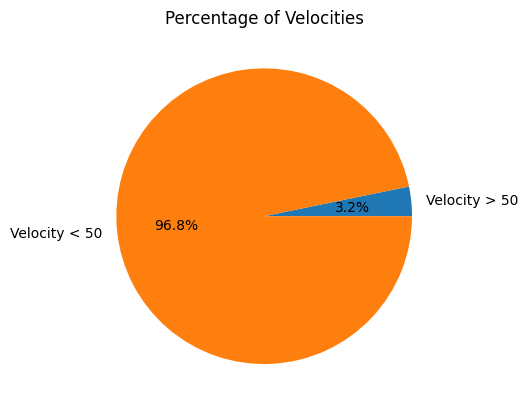

In [7]:
import matplotlib.pyplot as plt

fast = data.copy()
fast = fast[fast.velocity > 50]

slow = data.copy()
slow = slow[slow.velocity < 50]

fast_percentage = (fast.shape[0] / df.shape[0]) * 100
slow_percentage = (slow.shape[0] / df.shape[0]) * 100

plt.pie([fast_percentage, slow_percentage], labels=['Velocity > 50', 'Velocity < 50'], autopct='%1.1f%%')
plt.title('Percentage of Velocities')
plt.show()



In [8]:
df = data.copy()
df['velocity'] = df['velocity'].apply(lambda x: round(x))
df = df.groupby('velocity').size().reset_index(name='counts')
df = df.sort_values('counts', ascending=False)
df.head(10)


,velocity,counts
0,0,63310
1,1,19881
2,2,9241
3,3,8008
4,4,7606
5,5,7194
6,6,7094
7,7,6832
8,8,6515
9,9,6148


In [9]:
fig = px.bar(df, x='velocity', y='counts', text='counts')
fig.update_traces(texttemplate='%{text}', textposition='outside')
fig.update_layout(uniformtext_minsize=8, uniformtext_mode='hide')
fig.update_layout(xaxis_title='Prędkość', yaxis_title='Liczba')
fig.show()


## Dzielnice

źródło mapy z podziałem na dzielnice :https://github.com/andilabs/warszawa-dzielnice-geojson

In [10]:
import os
import geopandas as gpd
from shapely.geometry import Point


current_path = os.getcwd()
file_path = os.path.join(current_path, "warszawa-dzielnice.geojson")
warsaw_districts = gpd.read_file(file_path)


In [11]:
speed_df = data.copy()
speed_df['geometry'] = speed_df.apply(lambda row: Point(row['longitude'], row['latitude']), axis=1)
speed_gdf = gpd.GeoDataFrame(speed_df, geometry='geometry')

speed_gdf.head(10)

,line,velocity,latitude,longitude,geometry
0,225,0.643082,52.223185,21.102289,POINT (21.10229 52.22318)
1,219,12.668851,52.214022,21.111179,POINT (21.11118 52.21402)
2,213,2.621927,52.227255,21.094583,POINT (21.09458 52.22725)
3,213,37.823063,52.183314,21.196685,POINT (21.19669 52.18331)
4,225,0.208769,52.276453,21.167903,POINT (21.16790 52.27645)
5,225,22.860310,52.254491,21.110367,POINT (21.11037 52.25449)
6,213,9.251718,52.222927,21.101928,POINT (21.10193 52.22293)
7,219,0.272892,52.183918,21.187899,POINT (21.18790 52.18392)
8,L-8,15.696781,52.388984,21.013578,POINT (21.01358 52.38898)
9,L31,13.736874,52.441023,21.055934,POINT (21.05593 52.44102)


In [12]:
speed_gdf.crs = warsaw_districts.crs
speed_map = gpd.sjoin(left_df=speed_gdf.copy(), right_df=warsaw_districts[['name', 'geometry']], how="left", predicate="intersects")
speed_map = speed_map.drop(columns=['index_right'])
speed_map.head()

,line,velocity,latitude,longitude,geometry,name
0,225,0.643082,52.223185,21.102289,POINT (21.10229 52.22318),Warszawa
0,225,0.643082,52.223185,21.102289,POINT (21.10229 52.22318),Praga Południe
1,219,12.668851,52.214022,21.111179,POINT (21.11118 52.21402),Wawer
1,219,12.668851,52.214022,21.111179,POINT (21.11118 52.21402),Warszawa
2,213,2.621927,52.227255,21.094583,POINT (21.09458 52.22725),Warszawa


In [13]:
# > 50 km/h per district
fast = speed_map.copy()
fast = fast[fast.velocity > 50]
fast = fast.groupby('name').size().reset_index(name='counts')
fast

,name,counts
0,Bemowo,214
1,Białołęka,599
2,Bielany,384
3,Mokotów,798
4,Ochota,174
5,Praga Południe,558
6,Praga Północ,384
7,Rembertów,180
8,Targówek,417
9,Ursus,67


In [14]:
# wykres slupkowy
fig = px.bar(fast, x='name', y='counts', text='counts')
fig.update_traces(texttemplate='%{text}', textposition='outside')
fig.update_layout(uniformtext_minsize=8, uniformtext_mode='hide')
# nazwa osi x
fig.update_xaxes(title_text='Prędkość > 50 km/h z podziałem na dzielnice')
fig.show()

In [15]:
speed_dis = speed_map.copy()
speed_dis = speed_dis[speed_dis.name.isin(['Mokotów', 'Śródmieście', 'Ochota', 'Ursynów'])]
speed_dis["velocity"] = speed_dis["velocity"].apply(lambda x: round(x))
fig = px.histogram(speed_dis, x="velocity", color="name", barmode="group")
fig.update_layout(bargap=0.3)
fig.update_xaxes(title_text='Prędkość z podziałem na dzielnice')
fig.update_yaxes(title_text='Liczba')
fig.update_layout(legend_title_text='Dzielnice')
fig.show()